In [1]:
import os
import gc
import cv2
import math
import torch
import random
import shutil
import torchvision
import numpy as np
import torch.nn as nn
from PIL import Image
from tqdm.auto import tqdm
from torch.optim import Adam
import matplotlib.pyplot as plt
import torch.nn.functional as F
from collections import Counter
from pytorch_grad_cam import GradCAM
from torchvision.transforms import v2
from torch.amp import autocast, GradScaler
from torch.optim.lr_scheduler import OneCycleLR
from torch.utils.data import Dataset, DataLoader
from pytorch_grad_cam.utils.image import show_cam_on_image
from pytorch_grad_cam.utils.model_targets import BinaryClassifierOutputTarget

In [2]:
random.seed(17)

In [3]:
# import kagglehub

# # # Download latest version
# path = kagglehub.dataset_download("lakshaymiddha/crack-segmentation-dataset")

# print("Path to dataset files:", path)

Manually move the dataset to the current directory for the dataset to load correctly

In [4]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Dataset

This dataset loads RGB crack/non-crack images, applies basic preprocessing (conversion to tensors and float normalization), and automatically assigns binary labels based on the filename.

In [5]:
class CrackDataset(Dataset):
    def __init__(self, paths):
        self.transform = v2.Compose([
            v2.ToImage(),
            v2.ToDtype(torch.float32, scale=True)
        ])

        self.images = [Image.open(path).convert("RGB") for path in tqdm(paths)]

        self.targets = []
        for filename in paths:
            if "noncrack" in filename.lower():
                self.targets.append(0)
            else:
                self.targets.append(1)

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img = self.transform(self.images[idx])
        target = torch.tensor(self.targets[idx], dtype=torch.float32)
        return img, target

In [6]:
files = os.listdir("train/images/")
paths = [os.path.join("train/images/", filename) for filename in files if filename.lower().endswith(".jpg")]
random.shuffle(paths)

split_idx = int(0.8 * len(paths))
train_paths = paths[:split_idx]
valid_paths = paths[split_idx:]

files = os.listdir("test/images/")
test_paths = [os.path.join("test/images/", filename) for filename in files if filename.lower().endswith(".jpg")]

In [7]:
train_ds = CrackDataset(train_paths)
valid_ds = CrackDataset(valid_paths)
test_ds = CrackDataset(test_paths)

  0%|          | 0/7682 [00:00<?, ?it/s]

  0%|          | 0/1921 [00:00<?, ?it/s]

  0%|          | 0/1695 [00:00<?, ?it/s]

In [8]:
def print_dataset_stats(ds, name):
    counts = Counter(ds.targets)
    print(f"{name} dataset - Non-crack: {counts[0]}, Crack: {counts[1]}")

print_dataset_stats(train_ds, "Train")
print_dataset_stats(valid_ds, "Valid")
print_dataset_stats(test_ds, "Test")

Train dataset - Non-crack: 940, Crack: 6742
Valid dataset - Non-crack: 259, Crack: 1662
Test dataset - Non-crack: 212, Crack: 1483


In [9]:
train_dl = DataLoader(train_ds, batch_size=16, shuffle=True, num_workers=os.cpu_count()-3)
valid_dl = DataLoader(valid_ds, batch_size=16, shuffle=False, num_workers=os.cpu_count()-3)
test_dl = DataLoader(test_ds, batch_size=16, shuffle=False, num_workers=os.cpu_count()-3)

# Architecture

We tested:
- resnet 18
- resnet 50
- DenseNet
- EfficientNet_b0
- EfficientNet_V2_S

All of them where returning GradCam masks of similar quality, though aside from that `resnet50` was a little better than the rest, likely because it's relatively simple architecture makes the task easier for GradCam, we couldn't find any interesting patterns / observations that could be directly explained by the differences in architectures.

Also for all the architectures we made a training starting from pretrained weights and random weights - in all the cases it was much better to use pretrained weights, and train only the last layer leaving the rest of parameters untouched.

At the very end it is slightly beneficial to train entire network with very small lr: `1e-6` - `1e-5`

Additionaly we also tried CBAM which effectively alters the architecture by inserting attention layers in between, we decided to insert these additional layers to already trained resnet, and at first train only the attention layers and later train entire network with low lr (`1e-6`). We tried also other configurations like training the net from 0, but losing the high quality weights trained on **IMAGENET** is just not worth it.

In [10]:
class ChannelAttention(nn.Module):
    def __init__(self, in_planes, ratio=16):
        super().__init__()
        self.avg_pool = nn.AdaptiveAvgPool2d(1)
        self.max_pool = nn.AdaptiveMaxPool2d(1)

        self.fc1 = nn.Conv2d(in_planes, in_planes // ratio, 1, bias=False)
        self.relu1 = nn.ReLU()
        self.fc2 = nn.Conv2d(in_planes // ratio, in_planes, 1, bias=False)

        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        avg_out = self.fc2(self.relu1(self.fc1(self.avg_pool(x))))
        max_out = self.fc2(self.relu1(self.fc1(self.max_pool(x))))
        out = avg_out + max_out
        return self.sigmoid(out)


class SpatialAttention(nn.Module):
    def __init__(self, kernel_size=7):
        super().__init__()
        assert kernel_size in (3, 7)
        padding = 3 if kernel_size == 7 else 1

        self.conv = nn.Conv2d(2, 1, kernel_size, padding=padding, bias=False)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        avg_out = torch.mean(x, dim=1, keepdim=True)
        max_out, _ = torch.max(x, dim=1, keepdim=True)
        x = torch.cat([avg_out, max_out], dim=1)
        x = self.conv(x)
        return self.sigmoid(x)


class CBAM(nn.Module):
    def __init__(self, in_planes, ratio=16):
        super().__init__()
        self.ca = ChannelAttention(in_planes, ratio)
        self.sa = SpatialAttention()

    def forward(self, x):
        out = x * self.ca(x)
        out = out * self.sa(out)
        return out

In [11]:
class ResNet50_CBAM(nn.Module):
    def __init__(self):
        super().__init__()
        self.model = torchvision.models.resnet50()
        self.model.fc = nn.Linear(2048, 1)

        checkpoint = torch.load('model_checkpoints/resnet50.pth')
        self.model.load_state_dict(checkpoint['model_state_dict'])
        
        for param in self.model.parameters():
            param.requires_grad = False


        # INSERT CBAM MODULES
        self.cbam2 = CBAM(512)   # output channels of layer2
        self.cbam3 = CBAM(1024)  # output channels of layer3
        self.cbam4 = CBAM(2048)  # output channels of layer4

    def forward(self, x):
        x = self.model.conv1(x)
        x = self.model.bn1(x)
        x = self.model.relu(x)
        x = self.model.maxpool(x)

        x = self.model.layer1(x)
        # It is better not to insert cbam into early layers
        x = self.model.layer2(x)
        x = self.cbam2(x)

        x = self.model.layer3(x)
        x = self.cbam3(x)

        x = self.model.layer4(x)
        x = self.cbam4(x)

        x = self.model.avgpool(x)
        x = torch.flatten(x, 1)
        x = self.model.fc(x)
        return x

# Training

## Training functions

In [12]:
def train_step(model, dataloader, optimizer, scheduler, loss_fn, device):
    model.train()

    total_loss = 0
    correct = 0
    total = 0
    true_pos = 0
    false_pos = 0
    false_neg = 0

    for batch, target in dataloader:
        batch, target = batch.to(device), target.to(device)
        optimizer.zero_grad(set_to_none=True)

        # with autocast("cuda"):
        logits = model(batch)
        loss = loss_fn(logits.squeeze(), target.squeeze())

        # scaler.scale(loss).backward()
        # scaler.step(optimizer)
        # scaler.update()
        loss.backward()
        optimizer.step()
        scheduler.step()

        total_loss += loss.item()

        # Convert logits to binary predictions
        preds = torch.sigmoid(logits)
        preds = (preds > 0.5).int()
        preds = preds.squeeze()

        correct += (preds == target).sum().item()
        total += target.numel()

        # Calculate precision/recall components
        true_pos += ((preds == 1) & (target == 1)).sum().item()
        false_pos += ((preds == 1) & (target == 0)).sum().item()
        false_neg += ((preds == 0) & (target == 1)).sum().item()

    accuracy = correct / total
    precision = true_pos / (true_pos + false_pos + 1e-8)
    recall = true_pos / (true_pos + false_neg + 1e-8)
    avg_loss = total_loss / len(dataloader)

    return avg_loss, accuracy, precision, recall


def valid_step(model, dataloader, loss_fn, device):
    avg_loss = 0
    avg_accuracy = 0
    avg_precision = 0
    avg_recall = 0
    model.eval()

    with torch.inference_mode():
        for batch, target in dataloader:
            batch, target = batch.to(device), target.to(device)

            logits = model(batch)
            loss = loss_fn(logits.squeeze(), target.squeeze())
            avg_loss += loss.item()

            preds = torch.sigmoid(logits)
            preds = (preds > 0.5).int()
            preds = preds.squeeze()

            correct = (preds == target).sum().item()
            total = target.numel()

            true_pos = ((preds == 1) & (target == 1)).sum().item()
            false_pos = ((preds == 1) & (target == 0)).sum().item()
            false_neg = ((preds == 0) & (target == 1)).sum().item()

            accuracy = correct / total
            precision = true_pos / (true_pos + false_pos + 1e-8)
            recall = true_pos / (true_pos + false_neg + 1e-8)

            avg_accuracy += accuracy
            avg_precision += precision
            avg_recall += recall

    avg_loss /= len(dataloader)
    avg_accuracy /= len(dataloader)
    avg_precision /= len(dataloader)
    avg_recall /= len(dataloader)

    return avg_loss, avg_accuracy, avg_precision, avg_recall

In [13]:
def train(
    model,
    train_dl,
    valid_dl,
    optimizer,
    scheduler: OneCycleLR,
    loss_fn,
    epochs,
    start_checkpoint=None,
):
    os.makedirs("tmp_model_checkpoints", exist_ok=True)
    counter = 0  # count epochs without printing training stats
    # scaler = GradScaler("cuda")

    if start_checkpoint:
        start_epoch = start_checkpoint["epoch"] + 1
        best_loss = start_checkpoint["best_loss"]
        # scaler.load_state_dict(start_checkpoint["scaler_state_dict"])
    else:
        start_epoch = 0
        best_loss = float('inf')

    log_freq = (
        epochs - start_epoch
    ) // 1  # how often to print stats when no progress is made

    for epoch in tqdm(range(start_epoch, epochs), desc="Epochs"):
        counter += 1
        train_loss, train_acc, train_prec, train_rec = train_step(
            model, train_dl, optimizer, scheduler, loss_fn, device
        )

        valid_loss, valid_acc, valid_prec, valid_rec = valid_step(
            model, valid_dl, loss_fn, device
        )

        progress = False

        if valid_loss < best_loss:
            progress = True
            best_loss = valid_loss
            checkpoint = {
                "epoch": epoch,
                "model_state_dict": model.state_dict(),
                "best_loss": best_loss,
                "optimizer_state_dict": optimizer.state_dict(),
                "scheduler_state_dict": scheduler.state_dict(),
                # "scaler_state_dict": scaler.state_dict(),
            }
            torch.save(checkpoint, f"tmp_model_checkpoints/best_loss.pth")

        if epoch == epochs - 1:
            checkpoint = {
                "epoch": epoch,
                "model_state_dict": model.state_dict(),
                "best_loss": best_loss,
                "optimizer_state_dict": optimizer.state_dict(),
                "scheduler_state_dict": scheduler.state_dict(),
                # "scaler_state_dict": scaler.state_dict(),
            }
            torch.save(checkpoint, f"tmp_model_checkpoints/last.pth")

        if True or progress or counter >= log_freq:
            counter = 0
            print(
                f"Epoch: {epoch + 1} | "
                f"[train] loss: {train_loss:.4f} | "
                f"[valid] loss: {valid_loss:.4f} | "
                f"[valid] Accuracy: {valid_acc:.4f} | "
                f"[valid] Precision: {valid_prec:.4f} | "
                f"[valid] Recall: {valid_rec:.4f}"
            )

## Training

### ResNet50

At first train classifier only

In [14]:
model = torchvision.models.resnet50(weights=torchvision.models.ResNet50_Weights.IMAGENET1K_V1)

for param in model.parameters():
    param.requires_grad = False
    
model.fc = nn.Linear(2048, 1)
model.to(device);

In [15]:
loss_fn = nn.BCEWithLogitsLoss()
optimizer = Adam(model.parameters(), lr=1e-2)
scheduler = OneCycleLR(optimizer, max_lr=1e-2, steps_per_epoch=len(train_dl), epochs=10)

train(model, train_dl, valid_dl, optimizer, scheduler, loss_fn, 10)

Epochs:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1 | [train] loss: 0.1773 | [valid] loss: 0.0902 | [valid] Accuracy: 0.9690 | [valid] Precision: 0.9718 | [valid] Recall: 0.9935
Epoch: 2 | [train] loss: 0.0902 | [valid] loss: 0.1828 | [valid] Accuracy: 0.9520 | [valid] Precision: 0.9477 | [valid] Recall: 1.0000
Epoch: 3 | [train] loss: 0.0816 | [valid] loss: 0.0996 | [valid] Accuracy: 0.9685 | [valid] Precision: 0.9684 | [valid] Recall: 0.9964
Epoch: 4 | [train] loss: 0.0669 | [valid] loss: 0.0354 | [valid] Accuracy: 0.9861 | [valid] Precision: 0.9975 | [valid] Recall: 0.9861
Epoch: 5 | [train] loss: 0.0619 | [valid] loss: 0.5461 | [valid] Accuracy: 0.8492 | [valid] Precision: 1.0000 | [valid] Recall: 0.8263
Epoch: 6 | [train] loss: 0.0954 | [valid] loss: 0.0176 | [valid] Accuracy: 0.9959 | [valid] Precision: 0.9975 | [valid] Recall: 0.9975
Epoch: 7 | [train] loss: 0.0289 | [valid] loss: 0.0128 | [valid] Accuracy: 0.9964 | [valid] Precision: 0.9975 | [valid] Recall: 0.9981
Epoch: 8 | [train] loss: 0.0263 | [valid] loss: 0.0199 

Unfreeze all parameters and train with low learning rate

In [16]:
for param in model.parameters():
    param.requires_grad = True

In [17]:
loss_fn = nn.BCEWithLogitsLoss()
optimizer = Adam(model.parameters(), lr=1e-5)
scheduler = OneCycleLR(optimizer, max_lr=1e-5, steps_per_epoch=len(train_dl), epochs=10)

train(model, train_dl, valid_dl, optimizer, scheduler, loss_fn, 10)

Epochs:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1 | [train] loss: 0.0244 | [valid] loss: 0.0190 | [valid] Accuracy: 0.9943 | [valid] Precision: 0.9970 | [valid] Recall: 0.9964
Epoch: 2 | [train] loss: 0.0163 | [valid] loss: 0.0184 | [valid] Accuracy: 0.9954 | [valid] Precision: 0.9982 | [valid] Recall: 0.9963
Epoch: 3 | [train] loss: 0.0044 | [valid] loss: 0.0031 | [valid] Accuracy: 0.9990 | [valid] Precision: 1.0000 | [valid] Recall: 0.9989
Epoch: 4 | [train] loss: 0.0120 | [valid] loss: 0.0191 | [valid] Accuracy: 0.9943 | [valid] Precision: 0.9962 | [valid] Recall: 0.9970
Epoch: 5 | [train] loss: 0.0103 | [valid] loss: 0.0030 | [valid] Accuracy: 0.9995 | [valid] Precision: 1.0000 | [valid] Recall: 0.9994
Epoch: 6 | [train] loss: 0.0023 | [valid] loss: 0.0064 | [valid] Accuracy: 0.9974 | [valid] Precision: 1.0000 | [valid] Recall: 0.9972
Epoch: 7 | [train] loss: 0.0036 | [valid] loss: 0.0002 | [valid] Accuracy: 1.0000 | [valid] Precision: 1.0000 | [valid] Recall: 1.0000
Epoch: 8 | [train] loss: 0.0019 | [valid] loss: 0.0034 

Save the model for later

In [22]:
os.makedirs("model_checkpoints", exist_ok=True)
shutil.copy("tmp_model_checkpoints/last.pth", "model_checkpoints/resnet50.pth")

'model_checkpoints/resnet50.pth'

Clean memory

In [23]:
del model
gc.collect()
torch.cuda.empty_cache()

### ResNet50 + CBAM

Now lets train CBAM model, at initialization all parameters are frozen aside from new block attention layers

In [24]:
model = ResNet50_CBAM().to(device)

In [25]:
loss_fn = nn.BCEWithLogitsLoss()
optimizer = Adam(model.parameters(), lr=1e-2)
scheduler = OneCycleLR(optimizer, max_lr=1e-2, steps_per_epoch=len(train_dl), epochs=10)

train(model, train_dl, valid_dl, optimizer, scheduler, loss_fn, 10)

Epochs:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1 | [train] loss: 0.0078 | [valid] loss: 0.0018 | [valid] Accuracy: 0.9990 | [valid] Precision: 1.0000 | [valid] Recall: 0.9989
Epoch: 2 | [train] loss: 0.0011 | [valid] loss: 0.0014 | [valid] Accuracy: 0.9995 | [valid] Precision: 1.0000 | [valid] Recall: 0.9994
Epoch: 3 | [train] loss: 0.0010 | [valid] loss: 0.0020 | [valid] Accuracy: 0.9990 | [valid] Precision: 1.0000 | [valid] Recall: 0.9989
Epoch: 4 | [train] loss: 0.0020 | [valid] loss: 0.0015 | [valid] Accuracy: 0.9995 | [valid] Precision: 1.0000 | [valid] Recall: 0.9994
Epoch: 5 | [train] loss: 0.0007 | [valid] loss: 0.0024 | [valid] Accuracy: 0.9995 | [valid] Precision: 1.0000 | [valid] Recall: 0.9994
Epoch: 6 | [train] loss: 0.0015 | [valid] loss: 0.0019 | [valid] Accuracy: 1.0000 | [valid] Precision: 1.0000 | [valid] Recall: 1.0000
Epoch: 7 | [train] loss: 0.0010 | [valid] loss: 0.0021 | [valid] Accuracy: 0.9995 | [valid] Precision: 1.0000 | [valid] Recall: 0.9994
Epoch: 8 | [train] loss: 0.0021 | [valid] loss: 0.0007 

Unfreeze all parameters and train with low learning rate

In [26]:
for param in model.parameters():
    param.requires_grad = True

In [27]:
loss_fn = nn.BCEWithLogitsLoss()
optimizer = Adam(model.parameters(), lr=1e-6)
scheduler = OneCycleLR(optimizer, max_lr=1e-6, steps_per_epoch=len(train_dl), epochs=10)

train(model, train_dl, valid_dl, optimizer, scheduler, loss_fn, 10)

Epochs:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1 | [train] loss: 0.0011 | [valid] loss: 0.0009 | [valid] Accuracy: 1.0000 | [valid] Precision: 1.0000 | [valid] Recall: 1.0000
Epoch: 2 | [train] loss: 0.0014 | [valid] loss: 0.0018 | [valid] Accuracy: 0.9995 | [valid] Precision: 1.0000 | [valid] Recall: 0.9994
Epoch: 3 | [train] loss: 0.0007 | [valid] loss: 0.0016 | [valid] Accuracy: 0.9995 | [valid] Precision: 1.0000 | [valid] Recall: 0.9994
Epoch: 4 | [train] loss: 0.0011 | [valid] loss: 0.0007 | [valid] Accuracy: 1.0000 | [valid] Precision: 1.0000 | [valid] Recall: 1.0000
Epoch: 5 | [train] loss: 0.0008 | [valid] loss: 0.0010 | [valid] Accuracy: 1.0000 | [valid] Precision: 1.0000 | [valid] Recall: 1.0000
Epoch: 6 | [train] loss: 0.0011 | [valid] loss: 0.0014 | [valid] Accuracy: 0.9990 | [valid] Precision: 1.0000 | [valid] Recall: 0.9989
Epoch: 7 | [train] loss: 0.0005 | [valid] loss: 0.0016 | [valid] Accuracy: 0.9995 | [valid] Precision: 1.0000 | [valid] Recall: 0.9994
Epoch: 8 | [train] loss: 0.0005 | [valid] loss: 0.0004 

Save the model for later

In [28]:
os.makedirs("model_checkpoints", exist_ok=True)
shutil.copy("tmp_model_checkpoints/best_loss.pth", "model_checkpoints/resnet50_cbam.pth")

'model_checkpoints/resnet50_cbam.pth'

Clean memory

In [29]:
del model
gc.collect()
torch.cuda.empty_cache()

# Evaluation

Load the models for the following steps

In [31]:
resnet50 = torchvision.models.resnet50().to(device)
resnet50.fc = nn.Linear(2048, 1)

checkpoint = torch.load('model_checkpoints/resnet50.pth')
resnet50.load_state_dict(checkpoint['model_state_dict'])
resnet50.eval();

In [15]:
resnet50_cbam = ResNet50_CBAM().to(device)

for param in resnet50_cbam.parameters():
    param.requires_grad = True

checkpoint = torch.load('model_checkpoints/resnet50_cbam.pth')
resnet50_cbam.load_state_dict(checkpoint['model_state_dict'])
resnet50_cbam.eval();

Prepare a batch of testing images

In [16]:
batch, target = next(iter(test_dl))

# Grad-CAM

First I am going to compare Grad-CAM of batch of images to see if CBAM helps

In [20]:
def plot_gradcam_batch(model, input_tensor, target_layers, class_idx=1, n_cols=4, title=None):
    """
    Generate and plot Grad-CAM overlays for a batch of images in a grid.
    
    Args:
        model: PyTorch model
        input_tensor: torch.Tensor of shape (B, C, H, W)
        target_layers: list of layers to compute Grad-CAM on
        class_idx: int, target class index
        n_cols: int, number of columns in the grid
        title: optional string to place above the entire figure
    """
    model.eval()
    
    cam = GradCAM(model=model, target_layers=target_layers)
    batch_size = input_tensor.size(0)

    grayscale_cams = []
    for i in range(batch_size):
        cam_single = cam(input_tensor=input_tensor[i:i+1], targets=[BinaryClassifierOutputTarget(class_idx)])
        grayscale_cams.append(cam_single[0])

    grayscale_cams = np.stack(grayscale_cams)
    
    # Compute grid size
    n_rows = math.ceil(batch_size / n_cols)
    fig, axs = plt.subplots(n_rows, n_cols, figsize=(n_cols*3, n_rows*3))
    axs = axs.flatten()
    
    for i in range(batch_size):
        img = input_tensor[i].permute(1, 2, 0).detach().cpu().numpy()
        img = np.clip(img, 0, 1)
        cam_overlay = show_cam_on_image(img, grayscale_cams[i], use_rgb=True)
        axs[i].imshow(cam_overlay)
        axs[i].axis("off")
    
    # Hide any remaining axes
    for j in range(batch_size, len(axs)):
        axs[j].axis("off")
    
    # Add global title if provided
    if title is not None:
        fig.suptitle(title, fontsize=16)
    
    plt.tight_layout()
    plt.show()

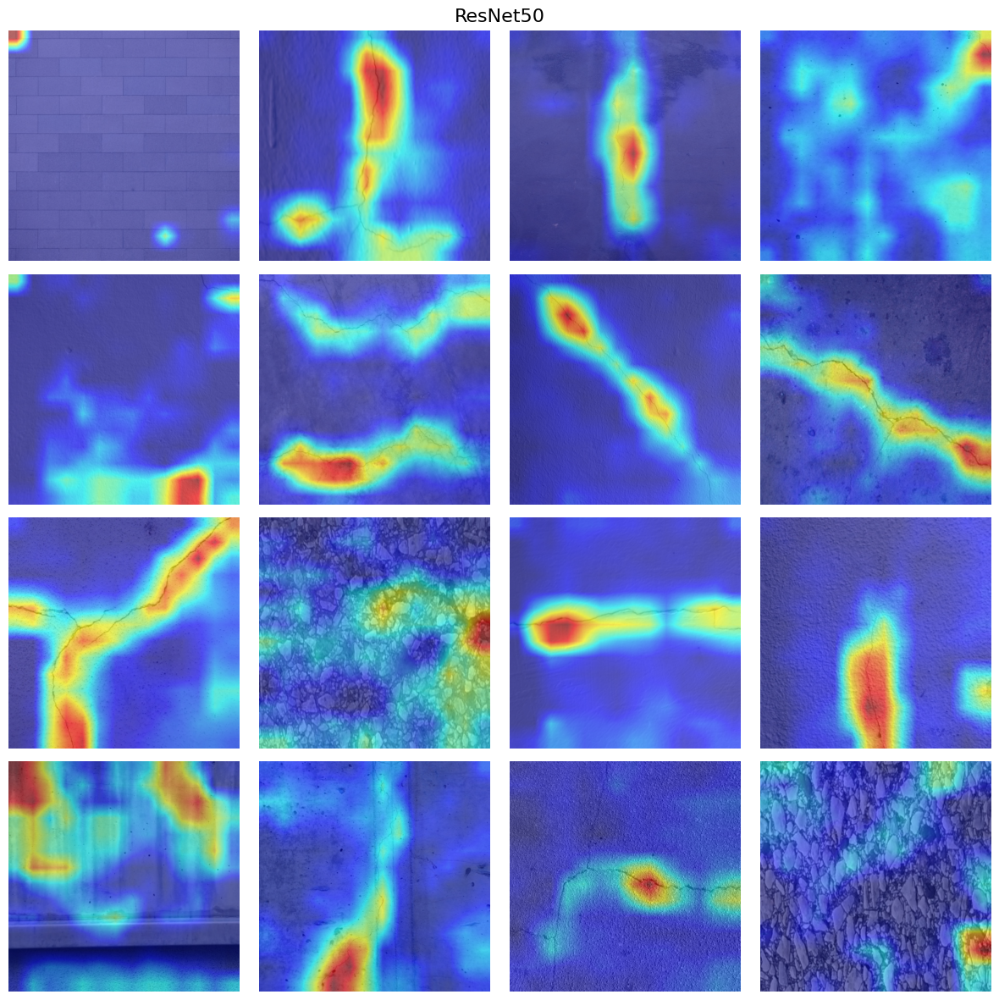

In [21]:
plot_gradcam_batch(resnet50, batch, [resnet50.layer4], class_idx=1, n_cols=4, title="ResNet50")

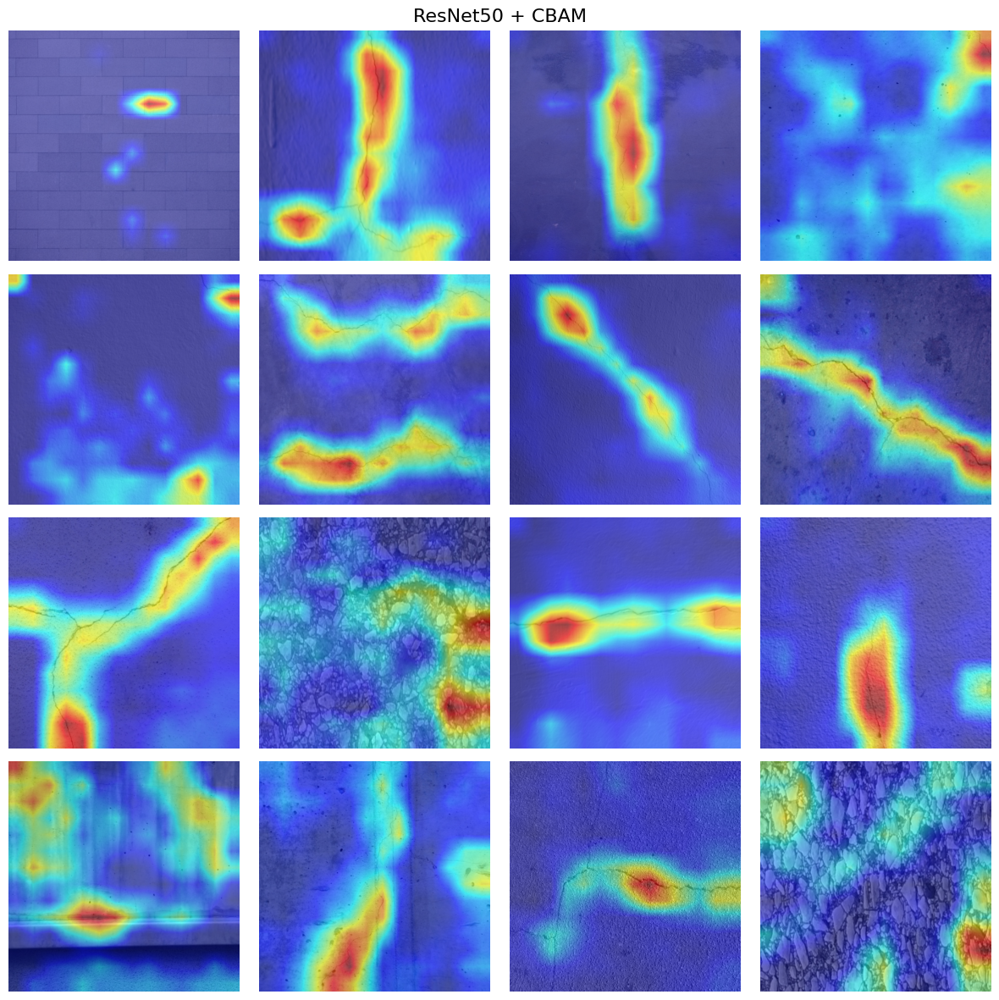

In [22]:
plot_gradcam_batch(resnet50_cbam, batch, [resnet50_cbam.model.layer4], class_idx=1, n_cols=4, title="ResNet50 + CBAM")

The results are very simillar with and without CBAM, sometimes it improves the results some times makes them worse, but I blieve it might be just a little better, so I will continue using it in the following experiments

## Grad-CAM on tiles

My first idea for improving the results is to divide the image into patches in hope that the network will be able to focus better on the details

In [23]:
def gradcam_on_tiles(model, image_tensor, target_layers, class_idx=1):
    """
    Compute Grad-CAM on 4 tiles and full image, then display in a 2x4 grid.
    
    Args:
        model: PyTorch model
        image_tensor: tensor of shape (1, C, H, W)
        target_layers: list of layers for Grad-CAM
        class_idx: binary class (1 = crack)
    """
    model.eval()
    device = next(model.parameters()).device
    image_tensor = image_tensor.to(device)

    _, C, H, W = image_tensor.shape
    h2, w2 = H // 2, W // 2

    # ----------- Split into 4 tiles -----------------
    tiles = [
        image_tensor[:, :, 0:h2, 0:w2],     # TL
        image_tensor[:, :, 0:h2, w2:W],     # TR
        image_tensor[:, :, h2:H, 0:w2],     # BL
        image_tensor[:, :, h2:H, w2:W],     # BR
    ]

    cam = GradCAM(model=model, target_layers=target_layers)

    tile_predictions = []
    tile_cams = []

    # ----------- Process tile-based Grad-CAM ----------
    for tile in tiles:
        # Upsample ×2 to match original resolution
        tile_np = tile[0].permute(1,2,0).cpu().numpy()
        up_h, up_w = tile_np.shape[0]*2, tile_np.shape[1]*2
        tile_np_up = cv2.resize(tile_np, (up_w, up_h), interpolation=cv2.INTER_CUBIC)
        tile_np_up = np.clip(tile_np_up, 0, 1)

        tile_up = torch.from_numpy(tile_np_up).permute(2,0,1).unsqueeze(0).float().to(device)

        with torch.no_grad():
            pred = torch.sigmoid(model(tile_up)).item()
        tile_predictions.append(pred)

        targets = [BinaryClassifierOutputTarget(class_idx)]
        grayscale_cam = cam(tile_up, targets=targets)[0]

        cam_overlay = show_cam_on_image(tile_np_up, grayscale_cam, use_rgb=True)
        tile_cams.append(cam_overlay)

    # ----------- Full-image Grad-CAM --------------------
    targets = [BinaryClassifierOutputTarget(class_idx)]
    full_cam = cam(image_tensor, targets=targets)[0]

    img_full = image_tensor[0].permute(1,2,0).detach().cpu().numpy()
    img_full = np.clip(img_full, 0, 1)

    full_cam_overlay = show_cam_on_image(img_full, full_cam, use_rgb=True)

    # ----------- Split full-image CAM into 4 tiles -----
    full_tiles = [
        full_cam_overlay[0:h2, 0:w2],
        full_cam_overlay[0:h2, w2:W],
        full_cam_overlay[h2:H, 0:w2],
        full_cam_overlay[h2:H, w2:W],
    ]

    # ----------- Plot: 2x4 grid -----------------------
    fig, axs = plt.subplots(2, 4, figsize=(16, 8))
    axs = axs.flatten()

    # Top row: tile-based CAMs
    for i in range(4):
        axs[i].imshow(tile_cams[i])
        axs[i].set_title(f"Tile {i+1}\nPred: {tile_predictions[i]:.3f}")
        axs[i].axis("off")

    # Bottom row: full-image CAM tiles
    for i in range(4):
        axs[i+4].imshow(full_tiles[i])
        axs[i+4].set_title(f"Full CAM Tile {i+1}")
        axs[i+4].axis("off")

    plt.tight_layout()
    plt.show()


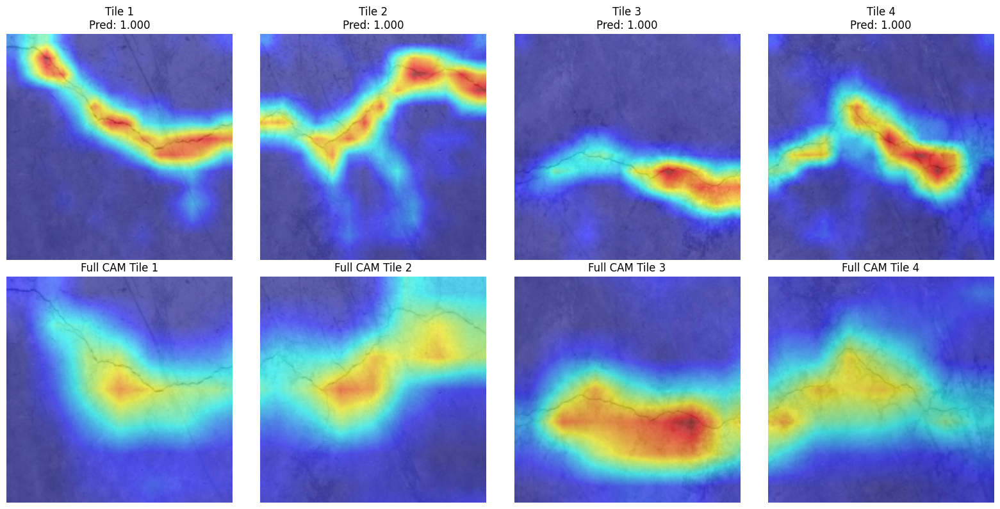

In [24]:
gradcam_on_tiles(resnet50_cbam, batch[5][None], [resnet50_cbam.model.layer4], class_idx=1)

On some images it is not so perfect, but here it looks very promissing

## Grad-CAM on upscaled images

Now I will try to see if upscaling an image will improve gradcam results

In [25]:
upscaled_batch = F.interpolate(batch, scale_factor=2, mode='bicubic', align_corners=False)

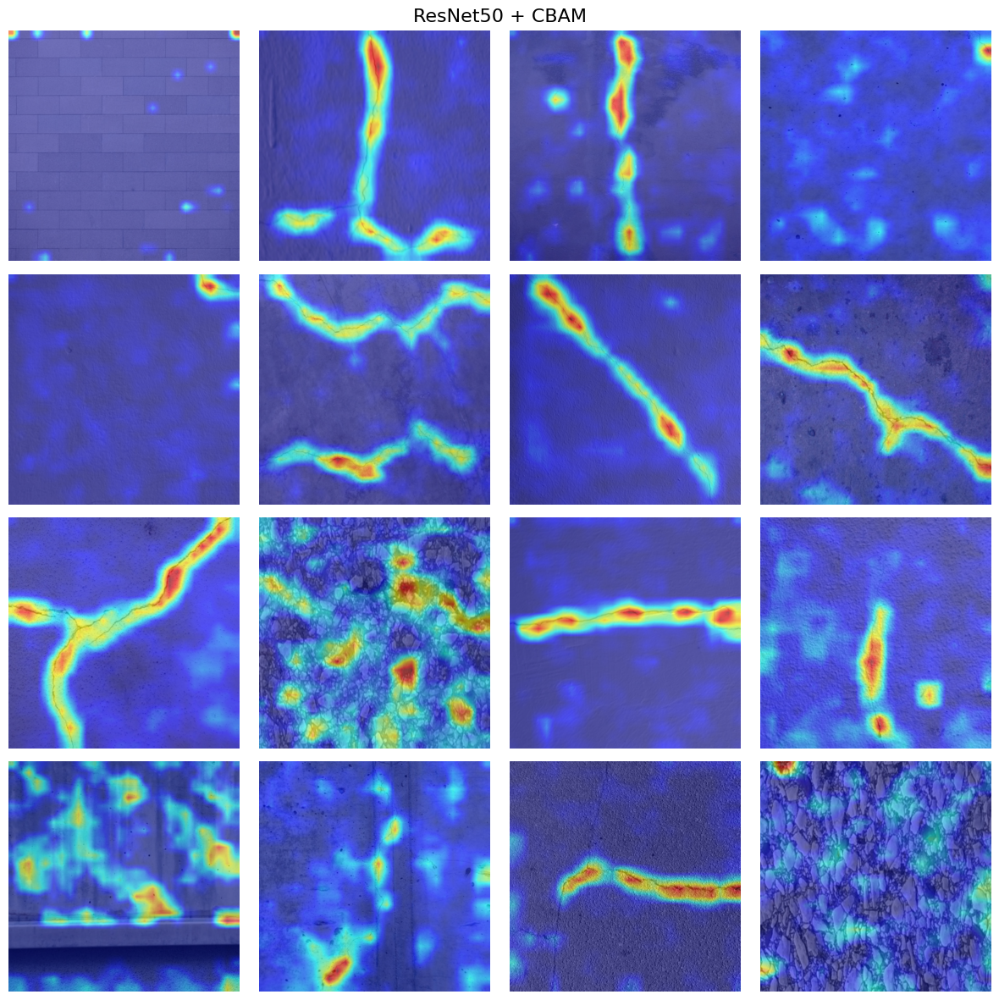

In [26]:
plot_gradcam_batch(resnet50_cbam, upscaled_batch, [resnet50_cbam.model.layer4], class_idx=1, n_cols=4, title="ResNet50 + CBAM")

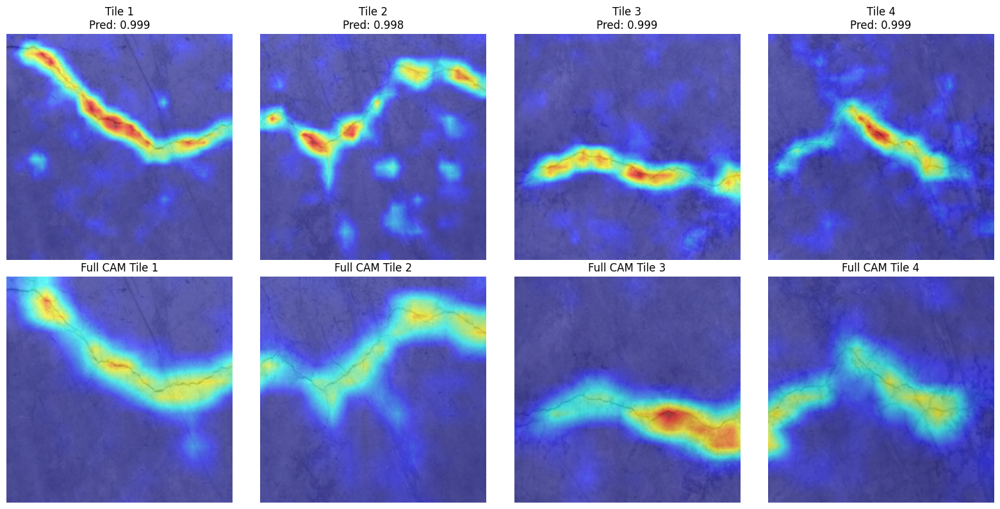

In [29]:
gradcam_on_tiles(resnet50_cbam, upscaled_batch[5][None], [resnet50_cbam.model.layer4], class_idx=1)

The upscaling is making a huge difference, and splitting into tiles will likely also increase the final results.

Actually, after testing those techniques on the segmentation, it didn't make such a huge differece in results and splitting into tiles made no noticable difference. I suspect that if the net is confident about where the crack is than the upscaling can help but if it is unsure than it won't make a difference or can potentially make things worse, same for splitting tiles